# Covid-19: Análisis del progreso de la vacunación mundial


# Índice 

- 1. Descripción de la base de datos
- 2. Missing Data 
- 3. EDA: Análisis exploratorio de los datos
- 3.1 Progreso del número de inmunizaciones

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import pylab
import scipy.stats as ss
import csv
import awoc
import numpy as np
import sklearn
from sklearn import datasets
import plotly.graph_objs as go

import pandas_profiling as pp
import pandas.util.testing as tm

import kaggle
import os

<ipython-input-3-0c7ff2a1f98d>:15: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
import zipfile

In [5]:
!chmod 600 ~/.kaggle/kaggle.json

In [6]:
kaggle.api.authenticate()

In [7]:
import os
#os.environ['KAGGLE_USERNAME'] = "carlosbgdlv" # username from the json file
#os.environ['KAGGLE_KEY'] = "872fe59349b4da02f837f243c6533328" # key from the json file

os.environ['KAGGLE_USERNAME'] = "gemaprez" # username from the json file
os.environ['KAGGLE_KEY'] = "0c7653649699c2a7ebd5b87331fd8669" # key from the json file

In [8]:
#!kaggle datasets download gpreda/covid-world-vaccination-progress -f country_vaccinations
!kaggle datasets download gpreda/covid-world-vaccination-progress -f country_vaccinations_by_manufacturer.csv --force
!kaggle datasets download gpreda/covid-world-vaccination-progress -f country_vaccinations.csv --force

  0%|                                                | 0.00/152k [00:00<?, ?B/s]
100%|████████████████████████████████████████| 152k/152k [00:00<00:00, 2.63MB/s]
  0%|                                                | 0.00/371k [00:00<?, ?B/s]
100%|████████████████████████████████████████| 371k/371k [00:00<00:00, 5.43MB/s]


In [9]:
#path_to_zip_file = "C:/Users/ywen2/Desktop/URJC/BACKUP PROCESADO/country_vaccinations.csv.zip"
#directory_to_extract_to= "C:/Users/ywen2/Desktop/URJC/BACKUP PROCESADO"

path_to_zip_file = "/Users/gema/Documents/Github/PROCESADO_MASIVO_DE_DATOS/country_vaccinations.csv.zip"
directory_to_extract_to= "/Users/gema/Documents/Github/PROCESADO_MASIVO_DE_DATOS"

with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [10]:
df = pd.read_csv("country_vaccinations.csv")
df2 = pd.read_csv("covid19_country_population.csv")
df_manufacturers = ("country_vaccinations_by_manufacturer.csv")

## 1.Descripción de la base de datos

#### Variables


1. **Country:** es el país para el que se proporciona la información sobre la vacunación;
2. **Country ISO Code** - código ISO del país;
3. **Fecha** - fecha para la entrada de datos; para algunas de las fechas tenemos sólo las vacunas diarias, para otras, sólo el total (acumulado);
3. **Total number of vaccinations** - es el número absoluto de vacunas totales en el país;
4. **Total number of people vaccinated** - una persona, dependiendo del esquema de vacunación, recibirá una o más (normalmente 2) vacunas; en un momento dado, el número de vacunaciones puede ser mayor que el número de personas;
5. **Número total de personas totalmente vacunadas** - es el número de personas que recibieron todo el conjunto de vacunas según el esquema de inmunización (típicamente 2); en un momento determinado, puede haber un cierto número de personas que recibieron una vacuna y otro número (menor) de personas que recibieron todas las vacunas del esquema;
6. **Daily vaccinations (raw):** para una determinada entrada de datos, el número de vacunaciones para esa fecha/país;
7. **Daily vaccinations:** para una determinada entrada de datos, el número de vacunaciones para esa fecha/país;
8. **Total vaccinations per hundred** - relación (en porcentaje) entre el número de vacunaciones y la población total hasta la fecha en el país;
9. **Total number of people vaccinated per hundred**  - relación (en porcentaje) entre la población vacunada y la población total hasta la fecha en el país;
10. **Total number of people fully vaccinated per hundred** - relación (en porcentaje) entre la población totalmente vacunada y la población total hasta la fecha en el país;
11. **Number of vaccinations per day** - número de vacunaciones diarias para ese día y país;
    Daily vaccinations per million  - relación (en ppm) entre el número de vacunaciones y la población total para la fecha en el país;
12. **Vaccines** - El tipo de vacunas utilizadas en el país;
13. **Source name** - fuente de la información (autoridad nacional, organización internacional, organización local, etc.);
14. **Source website**  - sitio web de la fuente de información.


In [11]:
df.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/


In [12]:
df2.head()

,CountryAlpha3Code,Population
0,ABW,106314.0
1,AFG,38041754.0
2,AGO,31825295.0
3,ALB,2854191.0
4,AND,77142.0


In [13]:
#getting a profile summary
pp.ProfileReport(df)

**Correlación**

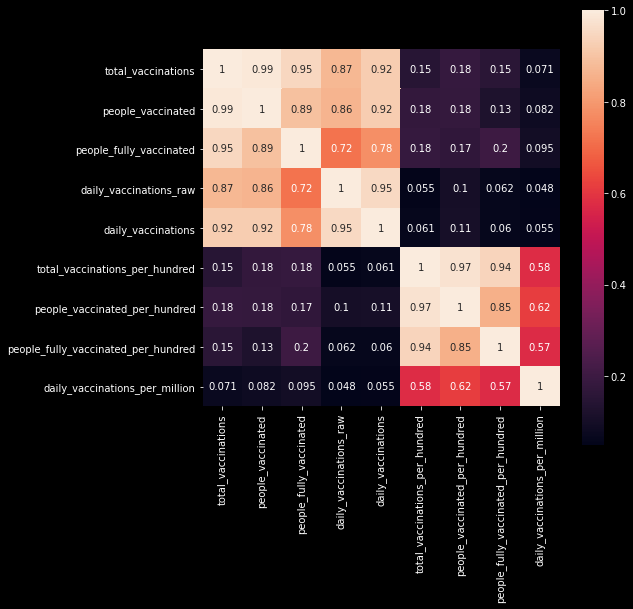

In [14]:
#correlation
plt.style.use('dark_background')
plt.subplots(figsize=(8, 8))
sns.heatmap(df.corr() , annot=True, square=True )
plt.show()

Eliminamos la columna daily_vaccinations_raw, ya que es una versión "a sucio" de daily_vaccinations, podemos ver que tienen un 0.95 de correlación.

In [15]:
df = df.drop('daily_vaccinations_raw', axis=1)

**Fecha**

Ponemos la fecha en nuestro formato (dd/mm/aaaa) 

In [16]:
df['date'] = pd.to_datetime(df['date'])
#df = df.sort_values('date', ascending=True)

df['date'] = df['date'].dt.strftime('%Y-%m-%d')

In [17]:
df[['date']] = df[['date']].apply(pd.to_datetime)

In [18]:
df.dtypes

country                                        object
iso_code                                       object
date                                   datetime64[ns]
total_vaccinations                            float64
people_vaccinated                             float64
people_fully_vaccinated                       float64
daily_vaccinations                            float64
total_vaccinations_per_hundred                float64
people_vaccinated_per_hundred                 float64
people_fully_vaccinated_per_hundred           float64
daily_vaccinations_per_million                float64
vaccines                                       object
source_name                                    object
source_website                                 object
dtype: object

**Unión de dataframe**

Vamos a combinar los dos dataframe para poder tener en el mismo los datos de vacunación y los datos de población. Vamos a unirlos utilizando pd.join, para ello primero vamos a renombrar la columna *CountryAlpha3Code* del data frame *covid19_country_population* y va a pasar a llamarse *iso_code* que es el nombre que tienen estos mismos datos en el dataframe *country_vaccinations_by_manufacturer*. Una vez que en ambos dataframe tenemos una columna con el mismo nombre y los mismos datos, ya podemos unirlos mediante esta.


In [19]:
df2 = df2.rename(columns={'CountryAlpha3Code': 'iso_code'})

In [20]:


#df_1 = df.set_index(['iso_code', 'date'])
df_1 = df.set_index('iso_code')
df_2 = df2.set_index('iso_code')
covid_vaccine_data = df_1.join(df_2)
covid_vaccine_data.head(5)

,country,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population
iso_code,,,,,,,,,,,,,,
ABW,Aruba,2021-03-29,25766.0,15600.0,10166.0,NaN,24.13,14.61,9.52,NaN,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-03-30,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-03-31,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-04-01,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
ABW,Aruba,2021-04-02,NaN,NaN,NaN,1278.0,NaN,NaN,NaN,11970.0,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0


**Vacunas**

Vamos a ver que tipo de vacunas se utilizan en cada país

In [21]:
covid_vaccine_data['vaccines'].unique()

array(['Pfizer/BioNTech',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing',
       'Oxford/AstraZeneca',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V',
       'Oxford/AstraZeneca, Pfizer/BioNTech',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sinopharm/Wuhan, Sputnik V',
       'Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V', 'Sputnik V',
       'Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech',
       'Oxford/AstraZeneca, Sinovac', 'Moderna, Pfizer/BioNTech',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac',
       'Covaxin, Oxford/AstraZeneca',
       'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech',
       'Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac', 'Sinopharm/Beijing',
       'Moderna, Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V',
       'Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing', 'Abdala',
       'Johnson&Johnson, Oxford

In [22]:
import plotly.express as px

Con unique_dates podemos saber que días se ha vacunado (teniendo en cuenta todos los países)

In [23]:
unique_dates = df['date'].unique()
#unique_dates = covid_vaccine_data['date'].unique()
type(unique_dates[0])

numpy.datetime64

Ordenamos los datos por fechas de vacunación (desde la más antigua a la más actual)

In [24]:
covid_vaccine_data.sort_values(by = 'date')

,country,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population
iso_code,,,,,,,,,,,,,,
NOR,Norway,2020-12-02,1.0,1.0,NaN,NaN,0.00,0.00,NaN,NaN,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Norwegian Institute of Public Health,https://www.fhi.no/sv/vaksine/koronavaksinasjo...,5347896.0
NOR,Norway,2020-12-03,1.0,1.0,NaN,0.0,0.00,0.00,NaN,0.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Norwegian Institute of Public Health,https://www.fhi.no/sv/vaksine/koronavaksinasjo...,5347896.0
NOR,Norway,2020-12-04,2.0,2.0,NaN,0.0,0.00,0.00,NaN,0.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Norwegian Institute of Public Health,https://www.fhi.no/sv/vaksine/koronavaksinasjo...,5347896.0
NOR,Norway,2020-12-05,2.0,2.0,NaN,0.0,0.00,0.00,NaN,0.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Norwegian Institute of Public Health,https://www.fhi.no/sv/vaksine/koronavaksinasjo...,5347896.0
NOR,Norway,2020-12-06,2.0,2.0,NaN,0.0,0.00,0.00,NaN,0.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Norwegian Institute of Public Health,https://www.fhi.no/sv/vaksine/koronavaksinasjo...,5347896.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUR,Suriname,2021-05-13,49902.0,48904.0,998.0,983.0,8.51,8.34,0.17,1676.0,Oxford/AstraZeneca,Government of Suriname,https://laatjevaccineren.sr/,581363.0
AUS,Australia,2021-05-13,2894770.0,NaN,NaN,60177.0,11.35,NaN,NaN,2360.0,"Oxford/AstraZeneca, Pfizer/BioNTech",Government of Australia via covidlive.com.au,https://covidlive.com.au/vaccinations,25364307.0
MWI,Malawi,2021-05-13,330348.0,330348.0,NaN,2657.0,1.73,1.73,NaN,139.0,Oxford/AstraZeneca,Ministry of Health,https://twitter.com/health_malawi/status/13928...,18628747.0




### 2. Missing Data

Veamos el número de NaN que tenemos por columnas y el porcentaje de NaN en cada una

In [25]:
covid_vaccine_data.isnull().sum()

country                                    0
date                                       0
total_vaccinations                      7356
people_vaccinated                       8081
people_fully_vaccinated                10422
daily_vaccinations                       216
total_vaccinations_per_hundred          7356
people_vaccinated_per_hundred           8081
people_fully_vaccinated_per_hundred    10422
daily_vaccinations_per_million           216
vaccines                                   0
source_name                                0
source_website                             0
Population                              1215
dtype: int64

In [26]:
covid_vaccine_data.isnull().sum()/len(covid_vaccine_data)*100

country                                 0.000000
date                                    0.000000
total_vaccinations                     41.778838
people_vaccinated                      45.896518
people_fully_vaccinated                59.192367
daily_vaccinations                      1.226785
total_vaccinations_per_hundred         41.778838
people_vaccinated_per_hundred          45.896518
people_fully_vaccinated_per_hundred    59.192367
daily_vaccinations_per_million          1.226785
vaccines                                0.000000
source_name                             0.000000
source_website                          0.000000
Population                              6.900665
dtype: float64

In [27]:
print("Vaccination date starts from ",unique_dates[0]," till ",unique_dates[-1])
print("Total Countries vaccinated :",len(covid_vaccine_data["country"].unique()))
print("Total Vaccines  :",len(covid_vaccine_data["vaccines"].unique()))

Vaccination date starts from  2021-02-22T00:00:00.000000000  till  2020-12-13T00:00:00.000000000
Total Countries vaccinated : 211
Total Vaccines  : 41


Vamos a hacer una estadísticas descriptivas que muestra la tendencia central, la dispersión y la forma de la distribución de un conjunto de datos, excluyendo los valores NaN.

In [28]:
covid_vaccine_data.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,Population
count,1.025100e+04,9.526000e+03,7.185000e+03,1.739100e+04,10251.000000,9526.000000,7185.000000,17391.000000,1.639200e+04
mean,5.716299e+06,3.500000e+06,1.817309e+06,7.941384e+04,17.199317,12.341277,6.403328,3031.492094,5.053192e+07
std,2.399767e+07,1.313534e+07,7.875693e+06,3.837504e+05,24.719775,16.087866,10.620806,4639.012478,1.802211e+08
min,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.164600e+04
25%,6.450950e+04,5.595875e+04,2.520600e+04,8.520000e+02,1.500000,1.390000,0.700000,355.000000,1.641172e+06
50%,4.701090e+05,3.617215e+05,1.920300e+05,5.974000e+03,7.170000,5.620000,2.670000,1523.000000,8.082366e+06
75%,2.154874e+06,1.491252e+06,7.725270e+05,3.005350e+04,22.565000,17.017500,7.470000,4122.500000,3.251045e+07
max,3.669100e+08,1.546242e+08,1.189873e+08,9.882286e+06,220.400000,114.950000,105.460000,118759.000000,1.397715e+09


In [29]:
covid_vaccine_data.columns

Index(['country', 'date', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population'],
      dtype='object')

# **3.EDA** : Análisis exploratorio de los datos

Vamos a proceder a obtener 4 dataframes de continentes diferentes para el posterior análisis de los datos. 

De Oceanía hay muy pocos datos y por este motivo lo hemos descartado

In [30]:
# Initialize the AWOC class.
my_world = awoc.AWOC()

#### Europe

In [31]:
nations_of_europe = my_world.get_countries_list_of('Europe')

In [32]:
europe = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_europe)]

#### Asia

In [33]:
nations_of_asia = my_world.get_countries_list_of('Asia')

In [34]:
asia = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_asia)]
print(asia.shape)

(4032, 14)


#### Africa

In [35]:
nations_of_africa = my_world.get_countries_list_of('Africa')

In [36]:
africa = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_africa)]
print(africa.shape)

(2197, 14)


#### Norte América

In [37]:
nations_of_north_america = my_world.get_countries_list_of('North America')

In [38]:
north_america = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_north_america)]
print(north_america.shape)

(2582, 14)


### 3.1.Progreso del número de inmunizaciones

Vamos a obtener el país de cada continente con mayor número de personas vacunadas y compararlos entre ellos. 

In [39]:
max_ = europe[europe['total_vaccinations'] == np.max(europe['total_vaccinations'])][['country','total_vaccinations']]
max_1 = africa[africa['total_vaccinations'] == np.max(africa['total_vaccinations'])][['country','total_vaccinations']]
max_2 = asia[asia['total_vaccinations'] == np.max(asia['total_vaccinations'])][['country','total_vaccinations']]
max_3 = north_america[north_america['total_vaccinations'] == np.max(north_america['total_vaccinations'])][['country','total_vaccinations']]


print(max_)
print(max_1)
print(max_2)
print(max_3)

                 country  total_vaccinations
iso_code                                    
GBR       United Kingdom          54797640.0
          country  total_vaccinations
iso_code                             
MAR       Morocco          10436046.0
         country  total_vaccinations
iso_code                            
CHN        China         366910000.0
                country  total_vaccinations
iso_code                                   
USA       United States         266596486.0


In [40]:
res = europe.groupby("country")["total_vaccinations"].agg(Numero_pacientes_vacunados="max")
#print(res)

In [41]:
vacc_GBR = europe.loc[europe.country == 'United Kingdom']
vacc_Morocco = africa.loc[africa.country == 'Morocco']
vacc_China = asia.loc[asia.country == 'China']
vacc_United_States = north_america.loc[north_america.country == 'United States']
total_vaccination = pd.concat([vacc_GBR, vacc_Morocco, vacc_China, vacc_United_States])

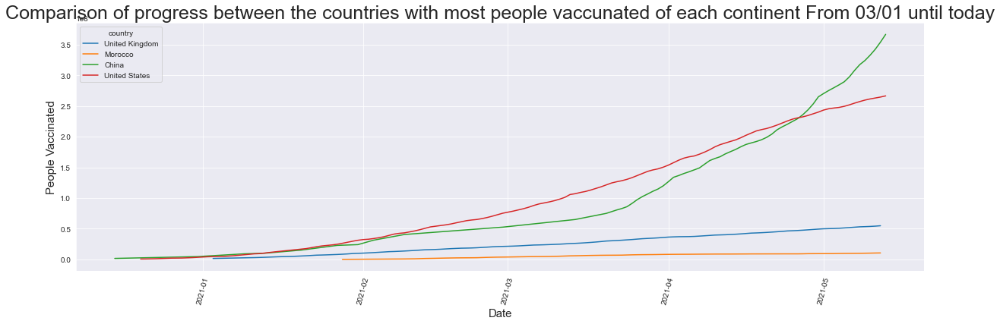

In [42]:
sns.set_style("darkgrid")
#plt.style.use('dark_background')
plt.figure(figsize=(20,6))
sns.lineplot(data= total_vaccination, x='date', y='total_vaccinations', hue = 'country', palette = 'tab10')
plt.xticks(rotation=75)
plt.title('Comparison of progress between the countries with most people vaccunated of each continent From 03/01 until today',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('People Vaccinated', fontsize=15)
plt.style.use('dark_background')
plt.show()


### 3.2.Daily vaccinations
Vamos observar el número de vacunados totales en todo el mundo cada día.

/Users/gema/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


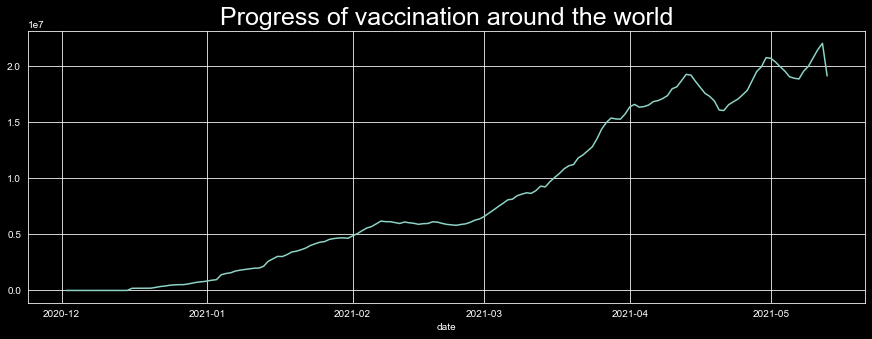

In [43]:
#daily vaccinations en todo el mundo
x= covid_vaccine_data.groupby("date").daily_vaccinations.sum()
plt.figure(figsize= (15,5))
sns.lineplot(x.index,x.values)
plt.title('Progress of vaccination around the world',fontsize=25)
plt.show()


Podemos obseravar que aunque algunos días hay un descenso de los vacunados, la tendencia de la curva es creciente y esto es lo más importante.

### 3.3. Población con mayor número de pacientes vacunados con las dos dosis en %

Además, también podemos estudiar en qué país está más avanzado el programa de vacunación. Para ello, tenemos que centrarnos en la variable **"people_fully_vaccinated_per_hundred"**. Esta varible refleja el ratio de la población totalmente inmunizada y la población total hasta la fecha en el país. Es importante tener en consideración este ratio porque no todos los países tienen la misma cantidad de población.


In [44]:
max_ = europe[europe['people_fully_vaccinated_per_hundred'] == np.max(europe['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_1 = africa[africa['people_fully_vaccinated_per_hundred'] == np.max(africa['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_2 = asia[asia['people_fully_vaccinated_per_hundred'] == np.max(asia['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_3 = north_america[north_america['people_fully_vaccinated_per_hundred'] == np.max(north_america['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]

print(max_)
print(max_1)
print(max_2)
print(max_3)

            country  people_fully_vaccinated_per_hundred
iso_code                                                
GIB       Gibraltar                               105.46
             country  people_fully_vaccinated_per_hundred
iso_code                                                 
SYC       Seychelles                                61.43
         country  people_fully_vaccinated_per_hundred
iso_code                                             
ISR       Israel                                58.86
                 country  people_fully_vaccinated_per_hundred
iso_code                                                     
CYM       Cayman Islands                                51.23


In [45]:
res = europe.groupby("country")["people_fully_vaccinated_per_hundred"].agg(Numero_pacientes_vacunados="max")
vacc_Gibraltar = europe.loc[europe.country == max_['country'][0]]
#vacc_Seychelles = africa.loc[africa.country == max_1['country'][0]]
vacc_Seychelles = africa.loc[africa.country == 'Seychelles']
#vacc_Israel = asia.loc[asia.country == max_2['country'][0]]
vacc_Israel = asia.loc[asia.country == 'Israel']
#vacc_NorthAmerica = north_america.loc[north_america.country == max_3['country'][0]]
vacc_NorthAmerica = north_america.loc[north_america.country == 'Cayman Islands']
inmunized = pd.concat([vacc_Gibraltar, vacc_Seychelles, vacc_Israel, vacc_NorthAmerica ])

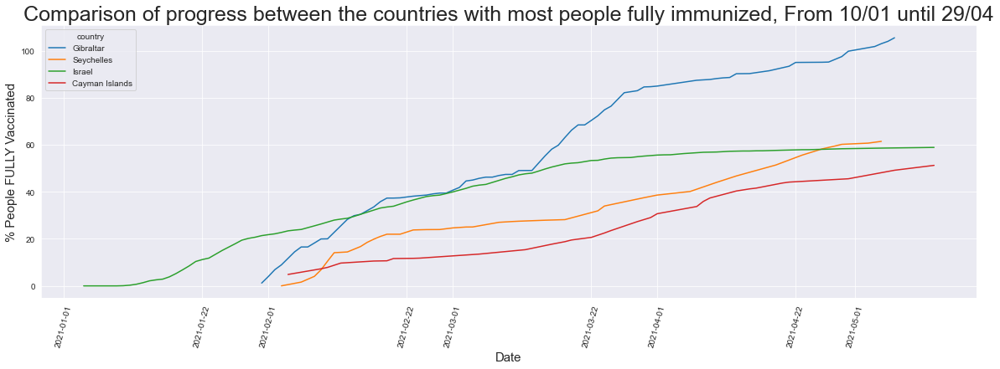

In [46]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data= inmunized, x='date', y='people_fully_vaccinated_per_hundred', hue = 'country', palette = 'tab10')
plt.xticks(rotation=75)
plt.title('Comparison of progress between the countries with most people fully immunized, From 10/01 until 29/04',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('% People FULLY Vaccinated', fontsize=15)
plt.show()

De este gráfico se pueden deducir varias cosas:

- El país que está más avanzado en su campaña de población es Gibraltar. Una de las razones principales a las que se debe esto, es que Gibraltar es un territorio pequeño (6,8 km^2) con una población de alrededor de 33000 personas. Se observa como alcanza la inmunidad de rebaño (70%) a mediados de marzo y continua subiendo. 

- Por otro lado, el segundo del mundo con mayor porcentaje de población totalmente inmunizada es Israel. Se aprecia como tiene un crecimiento bastante constante a medida que pasa el tiempo, hasta llegar a una estepa poco antes del 60%. 

- Las islas Caimán y las Seychelles comienzan su vacunación un poco más tarde, pero al ser también territorios con menos de 100000 personas, su ratio de inmunización es más elevado que otros territorios de su mismo continente. 

### 3. 4. Top countries with fully  vaccinated people
A continuación vamos a ver cuales son los países con mayor número de personas inmunizadas

In [47]:
covid_vaccine_data["Full_vaccinations(count)"] = covid_vaccine_data.groupby("country").people_fully_vaccinated.tail(1)
covid_vaccine_data.groupby("country")["Full_vaccinations(count)"].mean().sort_values(ascending= False).head(20)

country
United States     118987308.0
India              39274256.0
United Kingdom     18890969.0
Brazil             16215378.0
England            15935683.0
Turkey             10669750.0
Mexico              9861173.0
Russia              9129433.0
Indonesia           8919949.0
Germany             8822370.0
France              8632406.0
Italy               8079257.0
Chile               7374467.0
Spain               6716156.0
Israel              5094242.0
Morocco             4441667.0
Poland              4241956.0
Bangladesh          3496186.0
Hungary             2626857.0
Colombia            2612556.0
Name: Full_vaccinations(count), dtype: float64

Aquí vemos los países con más vacunas totales puestas

In [48]:
covid_vaccine_data["Total_vaccinations(count)"] = covid_vaccine_data.groupby("country").total_vaccinations.tail(1)
covid_vaccine_data.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)

country
China                   366910000.0
United States           266596486.0
India                   178361846.0
United Kingdom           54797640.0
Brazil                   50308106.0
England                  45908796.0
Germany                  38646171.0
France                   27455748.0
Italy                    25948925.0
Turkey                   25402277.0
Russia                   22782931.0
Indonesia                22617205.0
Mexico                   21986456.0
Spain                    21071940.0
Canada                   17297879.0
Chile                    16246599.0
Poland                   15144771.0
United Arab Emirates     11422565.0
Saudi Arabia             11195164.0
Israel                   10525163.0
Name: Total_vaccinations(count), dtype: float64

Para tener una idea más gráfica de como va la vacunación mundial representar primero en una gráfica y después en un mapa tanto el número de personas totalmente vacunadas como el número total de vacunas en cada país:

/Users/gema/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


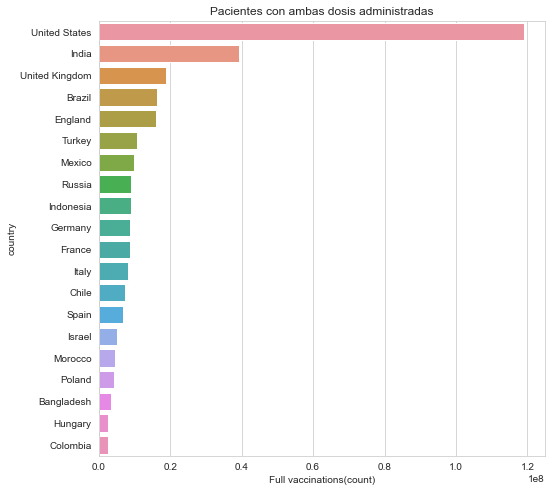

In [49]:
x= covid_vaccine_data.groupby("country")["Full_vaccinations(count)"].mean().sort_values(ascending= False).head(20)
sns.set_style("whitegrid")
plt.figure(figsize= (8,8))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Full vaccinations(count)")
plt.title('Pacientes con ambas dosis administradas')
plt.show()

In [50]:
fig = go.Figure(data=go.Choropleth(locations = covid_vaccine_data['country'],
                            locationmode='country names',
                            z = covid_vaccine_data["Full_vaccinations(count)"],
                            text = covid_vaccine_data['country'],       
                            colorscale = 'Reds',
                            autocolorscale=False,
                            marker_line_color='darkgray',
                            marker_line_width=0.5,
                        
                          ))

fig.update_layout(
    title_text='MAPA DE VACUNACIONES TOTALES: DOS DOSIS',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ))
fig.show()

/Users/gema/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



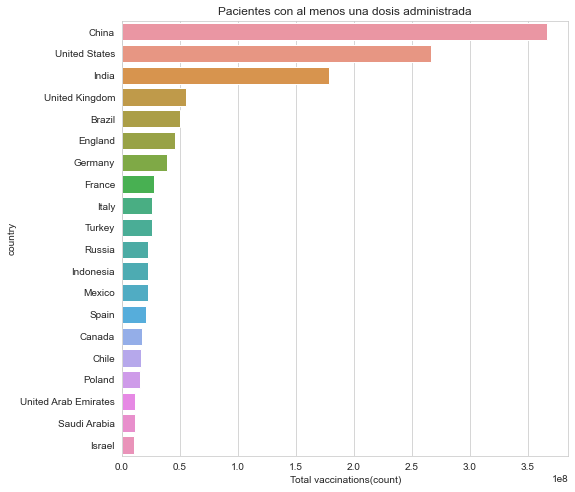

In [51]:
x= covid_vaccine_data.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)
sns.set_style("whitegrid")
plt.figure(figsize= (8,8))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Total vaccinations(count)")
plt.title('Pacientes con al menos una dosis administrada')
plt.show()

In [52]:
fig = go.Figure(data=go.Choropleth(locations = covid_vaccine_data['country'],
                            locationmode='country names',
                            z = covid_vaccine_data["Total_vaccinations(count)"],
                            text = covid_vaccine_data['country'],       
                            colorscale = 'Reds',
                            autocolorscale=False,
                            marker_line_color='darkgray',
                            marker_line_width=0.5,
                        
                          ))

fig.update_layout(
    title_text='MAPA DE AL MENOS UNA DOSIS SUMINISTRADA',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ))
fig.show()

Podemos observar que China es el país con más vacunas totales puestas pero que no aparece entre los países con más personsas totalmente inmunizadas, esto es porque no aporta datos suficientes respecto a la inoculación de las dos dosis de vacunas en su población. 

### 3.5. Diferentes vacunas

Encontrar cuales son los países que más han utilizado cada tipo de vacuna. 

In [53]:
#most common vaccines
covid_vaccine_data.vaccines.value_counts()

Oxford/AstraZeneca                                                                    3146
Moderna, Oxford/AstraZeneca, Pfizer/BioNTech                                          2265
Johnson&Johnson, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech                         1896
Oxford/AstraZeneca, Pfizer/BioNTech                                                   1412
Pfizer/BioNTech                                                                       1184
Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac                                           892
Moderna, Pfizer/BioNTech                                                               799
Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V                      775
Oxford/AstraZeneca, Sinopharm/Beijing                                                  667
Sputnik V                                                                              499
Oxford/AstraZeneca, Sinovac                                                            316

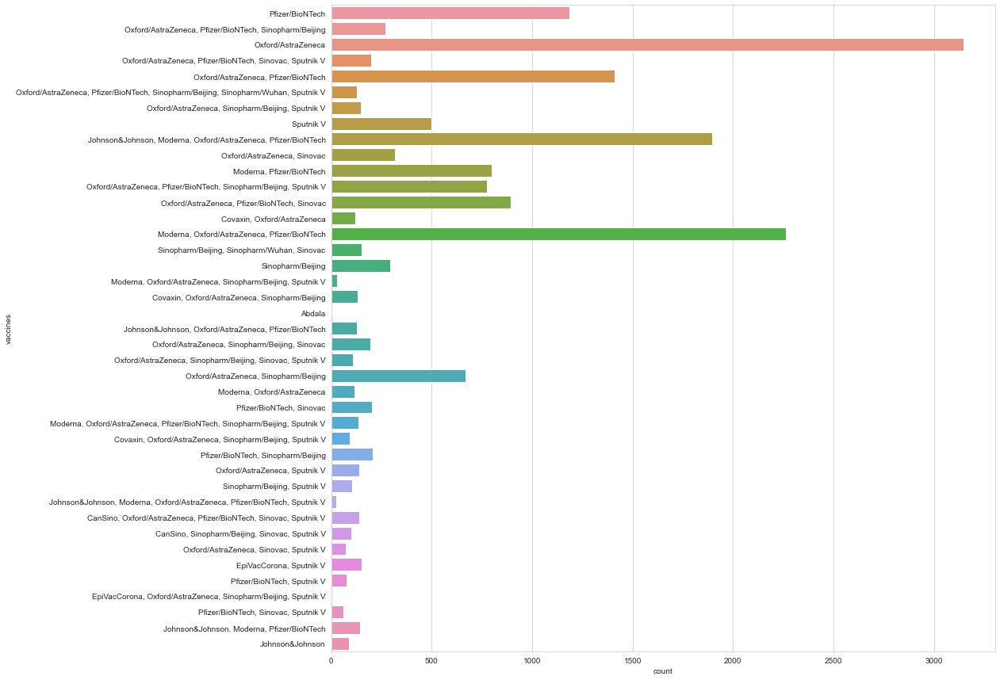

In [54]:
plt.figure(figsize=(15,15))
sns.countplot(y= "vaccines",data= covid_vaccine_data)
plt.show()

In [55]:
cntry_vaccine = covid_vaccine_data.groupby(["country", "iso_code", "vaccines"])['total_vaccinations', 
                                                                       'total_vaccinations_per_hundred',
                                                                      'daily_vaccinations',
                                                                      'daily_vaccinations_per_million',
                                                                      'people_vaccinated',
                                                                      'people_vaccinated_per_hundred',
                                                                       'people_fully_vaccinated', 
                                                                       'people_fully_vaccinated_per_hundred'
                                                                      ].max().reset_index()

cntry_vaccine.columns = ["Country", "iso_code", "Vaccines", "Total vaccinations", "Percent", "Daily vaccinations", 
                           "Daily vaccinations per million", "People vaccinated", "People vaccinated per hundred",
                           'People fully vaccinated', 'People fully vaccinated percent']

<ipython-input-55-5ca0293ab71a>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [56]:
cntry_vaccine.head(10)

,Country,iso_code,Vaccines,Total vaccinations,Percent,Daily vaccinations,Daily vaccinations per million,People vaccinated,People vaccinated per hundred,People fully vaccinated,People fully vaccinated percent
0,Afghanistan,AFG,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",504502.0,1.30,13921.0,358.0,448878.0,1.15,55624.0,0.14
1,Albania,ALB,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...",632676.0,21.98,17565.0,6104.0,444755.0,15.45,187921.0,6.53
2,Algeria,DZA,Sputnik V,75000.0,0.17,3748.0,85.0,NaN,NaN,NaN,NaN
3,Andorra,AND,"Oxford/AstraZeneca, Pfizer/BioNTech",31633.0,40.94,1182.0,15298.0,26931.0,34.86,4702.0,6.09
4,Angola,AGO,Oxford/AstraZeneca,626572.0,1.91,18751.0,571.0,586377.0,1.78,40195.0,0.12
5,Anguilla,AIA,Oxford/AstraZeneca,6898.0,45.98,331.0,22064.0,6115.0,40.76,783.0,5.22
6,Antigua and Barbuda,ATG,Oxford/AstraZeneca,31262.0,31.92,895.0,9139.0,31262.0,31.92,NaN,NaN
7,Argentina,ARG,"Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V",9541511.0,21.11,169014.0,3740.0,7912175.0,17.51,1629336.0,3.61
8,Armenia,ARM,Sputnik V,10727.0,0.36,248.0,84.0,10727.0,0.36,NaN,NaN
9,Aruba,ABW,Pfizer/BioNTech,85441.0,80.03,2493.0,23350.0,56932.0,53.32,28509.0,26.70


In [57]:
vaccince_types = cntry_vaccine.groupby(['Vaccines'])['iso_code'].unique()
vaccince_types = vaccince_types.reset_index()
vaccince_types

,Vaccines,iso_code
0,Abdala,[CUB]
1,"CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, ...",[MEX]
2,"CanSino, Sinopharm/Beijing, Sinovac, Sputnik V",[PAK]
3,"Covaxin, Oxford/AstraZeneca","[CAF, IND]"
4,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing","[COM, MUS]"
5,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing...",[IRN]
6,"EpiVacCorona, Oxford/AstraZeneca, Sinopharm/Be...",[TKM]
7,"EpiVacCorona, Sputnik V",[RUS]
8,Johnson&Johnson,[ZAF]
9,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...","[AUT, BEL, BGR, CZE, FRA, DEU, IRL, ITA, LVA, ..."


In [58]:
covid_vaccine_data.columns

Index(['country', 'date', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population',
       'Full_vaccinations(count)', 'Total_vaccinations(count)'],
      dtype='object')

In [59]:
covid_vaccine_data.reset_index(inplace=True)

In [60]:
info_vaccines = covid_vaccine_data[['iso_code', 'vaccines']].drop_duplicates()
info_vaccines.shape

(211, 2)

### Registro por país de cada tipo de vacuna utilizada.

In [61]:
#create dataframe with one record for each country and type of vaccine used
map_plot_df = pd.concat([pd.Series(row['iso_code'], row['vaccines'].split(','))              
                         for _, row in info_vaccines.iterrows()]).reset_index()
#rename columns
map_plot_df.columns = ['vaccine', 'iso_code']

#strip white spaces
map_plot_df['vaccine'] = map_plot_df['vaccine'].str.strip(' ')

map_plot_df.vaccine.value_counts()

Oxford/AstraZeneca    164
Pfizer/BioNTech        99
Moderna                47
Sinopharm/Beijing      45
Sputnik V              37
Sinovac                26
Johnson&Johnson        18
Covaxin                 5
EpiVacCorona            2
Sinopharm/Wuhan         2
CanSino                 2
Abdala                  1
Name: vaccine, dtype: int64

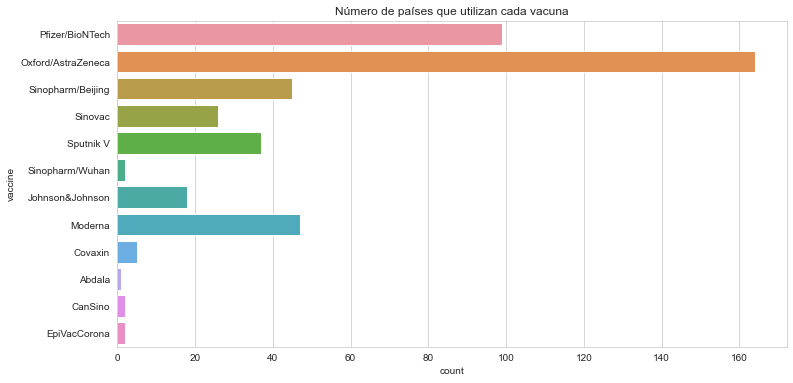

In [62]:
plt.figure(figsize=(12,6))
sns.countplot(y= "vaccine",data= map_plot_df)
plt.title('Número de países que utilizan cada vacuna')
plt.show()

In [63]:


fig = px.treemap(covid_vaccine_data,names = 'country',values = 'total_vaccinations',path = ['vaccines','country'],
                 title="Total Vaccinations per country grouped by Vaccines",
                 color_discrete_sequence =px.colors.qualitative.Set1)
fig.show()



In [64]:
#import geopandas

In [65]:
covid_vaccine_data.to_csv('covid_vaccine_data.csv')

# PARTE 2: España

### 1. Progresión de la vacunación diaria en España

In [66]:
vacc_Spain = covid_vaccine_data.loc[covid_vaccine_data.country == 'Spain']
vacc_Spain.set_index('date',inplace=True)

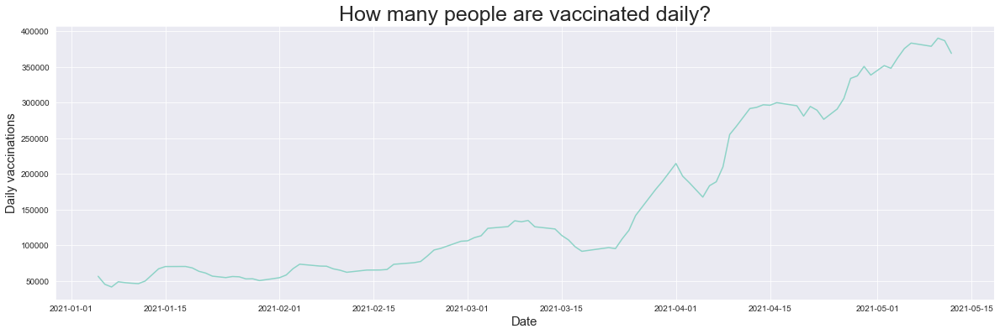

In [67]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data=vacc_Spain['daily_vaccinations'])
plt.title('How many people are vaccinated daily?',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('Daily vaccinations', fontsize=15)
plt.show()

#### 1.1 Últimos 14 días

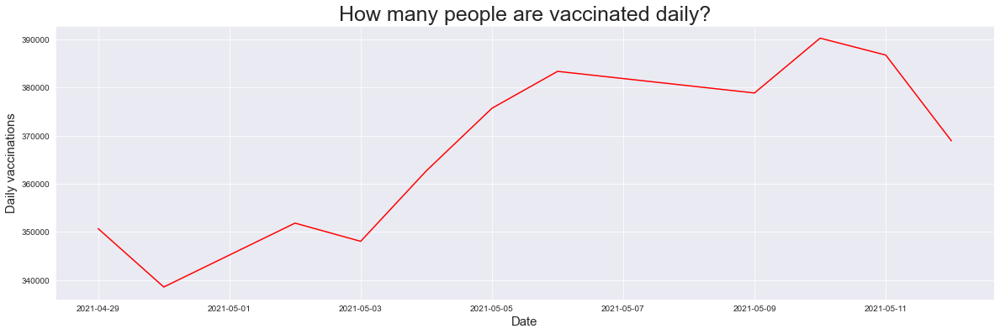

In [68]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data=vacc_Spain['daily_vaccinations'][-14:], color = 'r')
plt.title('How many people are vaccinated daily?',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('Daily vaccinations', fontsize=15)
plt.show()

#### Estadísticas generales sobre la vacunación diaria

In [69]:
vacc_Spain.describe().daily_vaccinations

count       128.000000
mean     156312.015625
std      110101.689377
min       41496.000000
25%       66966.000000
50%      108265.500000
75%      269227.000000
max      390264.000000
Name: daily_vaccinations, dtype: float64

In [70]:
last_14_days = vacc_Spain[-14:]
last_14_days.shape

(14, 16)

Ahora observamos las estadísticas de los **últimos 14 días**:

In [71]:
last_14_days.describe().daily_vaccinations

count        14.000000
mean     367350.785714
std       17499.767023
min      338524.000000
25%      350947.750000
50%      372298.000000
75%      381488.250000
max      390264.000000
Name: daily_vaccinations, dtype: float64

Vemos que la media de vacunación ha subido bastante en los últimos 14 días. 

### 2. Pacientes totalmente vacunados vs no vacunados totalmente

In [72]:
fvacc_Spain = vacc_Spain.people_fully_vaccinated.tail(113)
nfvacc_Spain = vacc_Spain.people_vaccinated.tail(113)

Text(0, 0.5, 'Number of people')

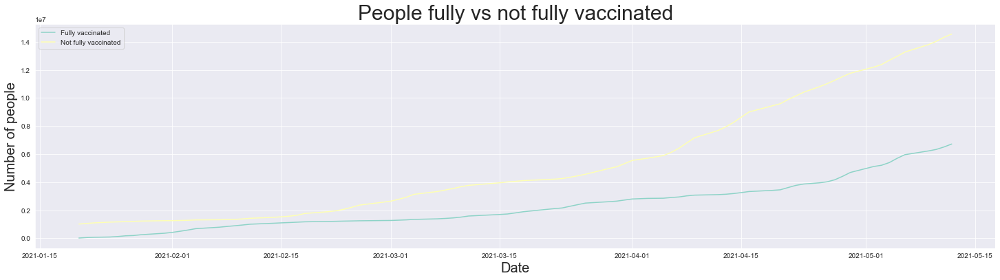

In [73]:
plt.figure(figsize=(25,6))
sns.lineplot(data=fvacc_Spain, label='Fully vaccinated')
sns.lineplot(data=nfvacc_Spain, label='Not fully vaccinated')

plt.title('People fully vs not fully vaccinated', fontsize=30)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Number of people', fontsize=20)

Text(0, 0.5, 'Number of people')

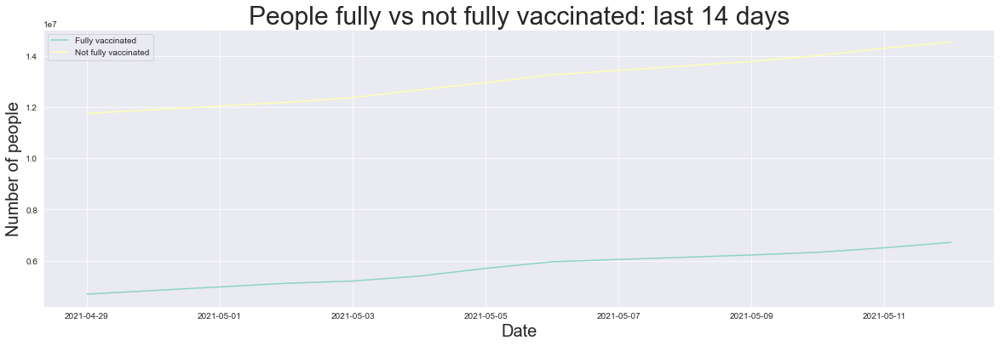

In [74]:
plt.figure(figsize=(20,6))
sns.lineplot(data=fvacc_Spain[-14:], label='Fully vaccinated')
sns.lineplot(data=nfvacc_Spain[-14:], label='Not fully vaccinated')

plt.title('People fully vs not fully vaccinated: last 14 days', fontsize=30)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Number of people', fontsize=20)